# IMGT residue frequency stats

In [21]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn import metrics
import logomaker
import itertools

%config InlineBackend.figure_format = 'retina'

## Heavy/Kappa/Lambda residue frequency

In [ ]:
HEAVY_POSITIONS = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23',
       '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34',
       '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45',
       '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56',
       '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67',
       '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78',
       '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89',
       '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100',
       '101', '102', '103', '104', '105', '106', '107', '108', '109',
       '110', '111', '111A', '111B', '111C', '111D', '111E', '111F',
       '111G', '111H', '111I', '111J', '111K', '111L', '112L', '112K',
       '112J', '112I', '112H', '112G', '112F', '112E', '112D', '112C',
       '112B', '112A', '112', '113', '114', '115', '116', '117', '118',
       '119', '120', '121', '122', '123', '124', '125', '126', '127',
       '128']
LIGHT_POSITIONS = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23',
       '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34',
       '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45',
       '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56',
       '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67',
       '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78',
       '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89',
       '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100',
       '101', '102', '103', '104', '105', '106', '107', '108', '109',
       '110', '111', '111A', '111B', '111C', '111D', '111E', '111F',
       '112F', '112E', '112D', '112C', '112B', '112A', '112', '113',
       '114', '115', '116', '117', '118', '119', '120', '121', '122',
       '123', '124', '125', '126', '127']

In [ ]:
def plot_logo(counts, figsize=(40, 2.5), ax=None, title='', title_fontsize=20, color_scheme='chemistry'):
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    logo = logomaker.Logo(counts.reset_index(drop=True), width=0.95, color_scheme=color_scheme, ax=ax, flip_below=False)
    ax.set_xticks(list(range(len(counts))));
    ax.set_xticklabels(counts.index, rotation=90)
    ax.set_title(title, fontsize=title_fontsize)
    return ax

In [ ]:
def compute_freq(positions, norm=True, min_seqs=100):
    counts = positions.apply(pd.Series.value_counts).T.drop(columns=['-']).fillna(0).astype(int)
    counts.index.name = 'imgt_pos'
    # only keep positions found in at least 100 sequences
    counts = counts[counts.sum(axis=1) >= min_seqs]
    return counts.divide(counts.sum(axis=1), axis=0) if norm else counts

In [8]:
all_seqs = pd.concat([
    pd.read_csv('../../../oas-dataset/data/human/subsets/10k_complete_seqs_per_subject/seqs_H.csv'),
    pd.read_csv('../../../oas-dataset/data/human/subsets/10k_complete_seqs_per_subject/seqs_KL.csv')
], sort=False, ignore_index=True)
all_seqs['v_gene_name'] = all_seqs['v_gene'].apply(lambda s: s.split('*')[0])
all_seqs.head()

,study_path,subject,unit_path,chain_type,v_gene_family,v_gene,j_gene_family,j_gene,1,2,...,120,121,122,123,124,125,126,127,128,v_gene_name
0,Waltari_2018,Waltari_2018:MT1214,Waltari_2018_Heavy_HIV_PBMCs_IGHG_Heavy_HIV_PB...,H,IGHV4,IGHV4-30-4*07,IGHV4,IGHJ6*01,Q,V,...,Q,G,T,T,V,I,V,S,S,IGHV4-30-4
1,Waltari_2018,Waltari_2018:MT1214,Waltari_2018_Heavy_HIV_PBMCs_IGHG_Heavy_HIV_PB...,H,IGHV1,IGHV1-69D*01,IGHV1,IGHJ4*02,Q,V,...,Q,G,T,S,V,T,V,S,S,IGHV1-69D
2,Waltari_2018,Waltari_2018:MT1214,Waltari_2018_Heavy_HIV_PBMCs_IGHG_Heavy_HIV_PB...,H,IGHV3,IGHV3-30*02,IGHV3,IGHJ3*02,Q,V,...,H,G,T,V,V,I,V,S,S,IGHV3-30
3,Waltari_2018,Waltari_2018:MT1214,Waltari_2018_Heavy_HIV_PBMCs_IGHG_Heavy_HIV_PB...,H,IGHV4,IGHV4-38-2*02,IGHV4,IGHJ2*01,Q,V,...,R,G,T,L,V,T,V,S,S,IGHV4-38-2
4,Waltari_2018,Waltari_2018:MT1214,Waltari_2018_Heavy_HIV_PBMCs_IGHG_Heavy_HIV_PB...,H,IGHV4,IGHV4-59*08,IGHV4,IGHJ4*02,Q,V,...,Q,G,T,L,V,T,V,S,S,IGHV4-59


In [46]:
all_seqs['chain_type'].value_counts().apply('{:,} complete seqs'.format)

H    2,649,527 complete seqs
K    1,034,397 complete seqs
L      605,263 complete seqs
Name: chain_type, dtype: object

In [47]:
all_seqs.groupby('chain_type')['subject'].nunique().apply('{} unique subjects'.format)

chain_type
H    358 unique subjects
K    165 unique subjects
L    161 unique subjects
Name: subject, dtype: object

In [48]:
v_genes_per_subject = all_seqs.groupby(['chain_type', 'subject'])['v_gene_name'].value_counts(normalize=True).unstack()
v_genes_per_subject.head()

v_gene_name                            IGHV1-18   IGHV1-2  IGHV1-24   IGHV1-3  \
chain_type subject                                                              
H          Bernat_2019:A007            0.093241  0.013677  0.004093  0.037337   
           Bhiman_2015:CAP256               NaN       NaN       NaN       NaN   
           Bonsignori_2016:CH505       0.013877  0.016711  0.008209  0.001954   
           Briney_2019:Subject-316188  0.044872  0.089744       NaN       NaN   
           Briney_2019:Subject-326650       NaN  0.007812       NaN       NaN   

v_gene_name                            IGHV1-45  IGHV1-46  IGHV1-58  IGHV1-69  \
chain_type subject                                                              
H          Bernat_2019:A007                 NaN  0.012079  0.001597  0.022562   
           Bhiman_2015:CAP256               NaN       NaN       NaN  0.000093   
           Bonsignori_2016:CH505            NaN  0.013290  0.000293  0.031271   
           Briney_2019:Subject-316188       NaN  0.006410       NaN       NaN   
           Briney_2019:Subject-326650       NaN  0.003906       NaN       NaN   

v_gene_name                            IGHV1-69-2  IGHV1-69D  ...  IGLV4-60  \
chain_type subject                                            ...             
H          Bernat_2019:A007                   NaN   0.000100  ...       NaN   
           Bhiman_2015:CAP256                 NaN   0.000280  ...       NaN   
           Bonsignori_2016:CH505         0.013193   0.022281  ...       NaN   
           Briney_2019:Subject-316188         NaN        NaN  ...       NaN   
           Briney_2019:Subject-326650         NaN        NaN  ...       NaN   

v_gene_name                            IGLV4-69  IGLV5-37  IGLV5-39  IGLV5-45  \
chain_type subject                                                              
H          Bernat_2019:A007                 NaN       NaN       NaN       NaN   
           Bhiman_2015:CAP256               NaN       NaN       NaN       NaN   
           Bonsignori_2016:CH505            NaN       NaN       NaN       NaN   
           Briney_2019:Subject-316188       NaN       NaN       NaN       NaN   
           Briney_2019:Subject-326650       NaN       NaN       NaN       NaN   

v_gene_name                            IGLV5-52  IGLV6-57  IGLV7-43  IGLV7-46  \
chain_type subject                                                              
H          Bernat_2019:A007                 NaN       NaN       NaN       NaN   
           Bhiman_2015:CAP256               NaN       NaN       NaN       NaN   
           Bonsignori_2016:CH505            NaN       NaN       NaN       NaN   
           Briney_2019:Subject-316188       NaN       NaN       NaN       NaN   
           Briney_2019:Subject-326650       NaN       NaN       NaN       NaN   

v_gene_name                            IGLV8-61  
chain_type subject                               
H          Bernat_2019:A007                 NaN  
           Bhiman_2015:CAP256               NaN  
           Bonsignori_2016:CH505            NaN  
           Briney_2019:Subject-316188       NaN  
           Briney_2019:Subject-326650       NaN  

[5 rows x 119 columns]

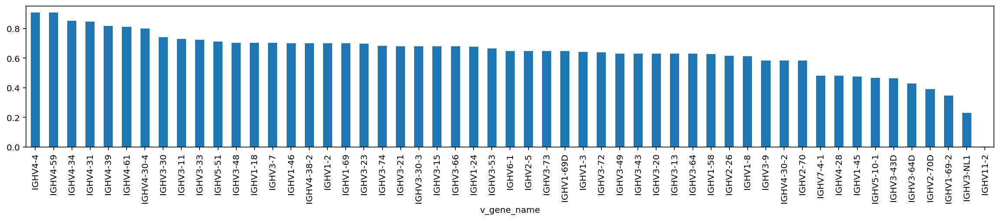

In [23]:
vh_gene_presence = (v_genes_per_subject > 0).loc['H'].mean().sort_values()
vh_gene_presence = vh_gene_presence[vh_gene_presence > 0]

vh_gene_presence[::-1].plot.bar(figsize=(20, 3));

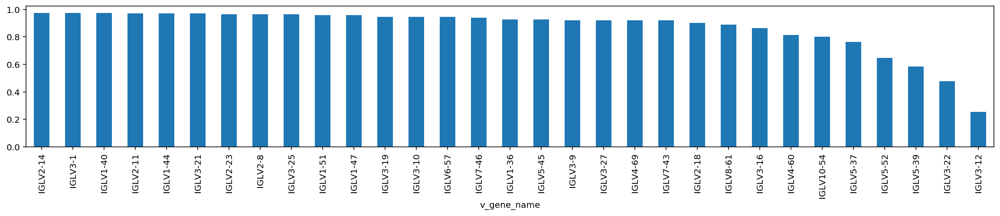

In [24]:
vl_gene_presence = (v_genes_per_subject > 0).loc['L'].mean().sort_values()
vl_gene_presence = vl_gene_presence[vl_gene_presence > 0]

vl_gene_presence[::-1].plot.bar(figsize=(20, 3));

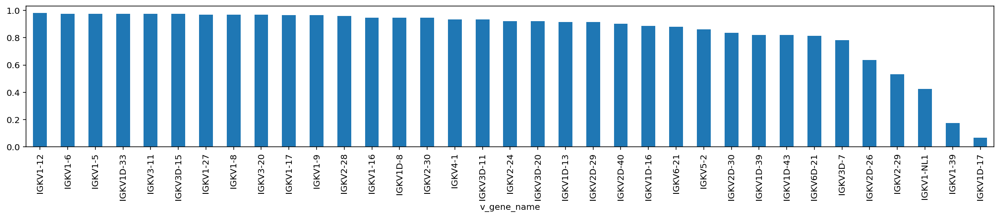

In [25]:
vk_gene_presence = (v_genes_per_subject > 0).loc['K'].mean().sort_values()
vk_gene_presence = vk_gene_presence[vk_gene_presence > 0]

vk_gene_presence[::-1].plot.bar(figsize=(20, 3));

In [39]:
gene_presence = pd.concat([vh_gene_presence, vl_gene_presence, vk_gene_presence]).sort_values(ascending=False).rename('% subjects')
gene_presence.index.name = 'v_gene_name'
gene_presence.head()

v_gene_name
IGKV1-12     0.981818
IGKV3-11     0.975758
IGKV3D-15    0.975758
IGKV1-6      0.975758
IGKV1D-33    0.975758
Name: % subjects, dtype: float64

In [40]:
gene_presence.to_csv('../../data/oas_stats/v_gene_presence_in_subjects.tsv', header=True, sep='\t')

# Germline frequency

# Positional residue frequency

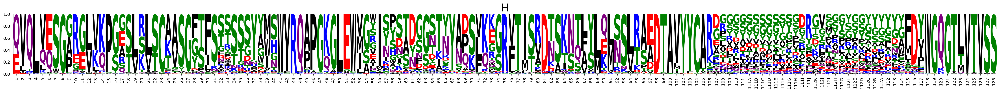

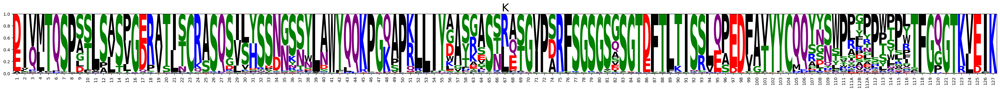

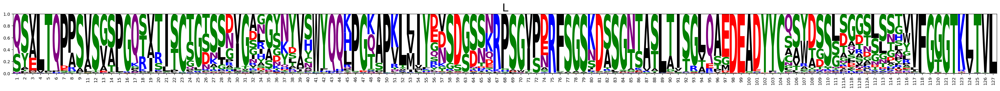

In [130]:
types = {'H': 'Heavy', 'L': 'Lambda', 'K': 'Kappa'}
for chain_type, seqs in all_seqs.groupby('chain_type'):
    freq = compute_freq(seqs[HEAVY_POSITIONS if chain_type == 'H' else LIGHT_POSITIONS])
    ax = plot_logo(freq)
    ax.set_title(chain_type, fontsize=25)
    freq_formatted = freq.apply(lambda col: col.apply(lambda v: '0' if v == 0 else '{:.4f}'.format(v)))
    freq_formatted.to_csv(f'../../data/oas_stats/imgt_residue_frequency/{types[chain_type]}.tsv', sep='\t')

## Germline family residue frequency

In [42]:
heavy_seqs = pd.read_csv('../../data/oas_stats/subsets/oas_100seqs_per_subject_and_germline_family_H.csv.gz')
# Not enough data for germlines IGHV8 IGHV9 IGHV11
heavy_seqs = heavy_seqs[~heavy_seqs['v_gene_family'].isin(['IGHV8','IGHV9','IGHV11'])]
heavy_seqs.head()

,study_path,subject,unit_path,chain_type,v_gene_family,v_gene,j_gene_family,j_gene,1,2,...,119,120,121,122,123,124,125,126,127,128
0,Bernat_2019,Bernat_2019:A007,Bernat_2019_Heavy_IGHM_Heavy_IgM_A007_igblastn...,H,IGHV1,IGHV1-18*01,IGHV1,IGHJ6*01,Q,V,...,G,Q,G,T,T,V,T,V,S,S
1,Bernat_2019,Bernat_2019:A007,Bernat_2019_Heavy_IGHM_Heavy_IgM_A007_igblastn...,H,IGHV1,IGHV1-69*02,IGHV1,IGHJ6*01,Q,V,...,G,Q,G,T,T,V,T,V,S,S
2,Bernat_2019,Bernat_2019:A007,Bernat_2019_Heavy_IGHA_Heavy_IgG_A007_igblastn...,H,IGHV1,IGHV1-18*01,IGHV1,IGHJ3*02,Q,V,...,G,Q,G,T,M,V,T,V,S,S
3,Bernat_2019,Bernat_2019:A007,Bernat_2019_Heavy_IGHG_Heavy_IgG_A007_igblastn...,H,IGHV1,IGHV1-2*04,IGHV1,IGHJ6*01,Q,V,...,G,Q,G,T,T,V,T,V,S,S
4,Bernat_2019,Bernat_2019:A007,Bernat_2019_Heavy_IGHM_Heavy_IgM_A007_igblastn...,H,IGHV1,IGHV1-18*01,IGHV1,IGHJ4*02,Q,I,...,G,Q,G,T,L,V,T,V,S,S


In [43]:
light_seqs = pd.read_csv('../../data/oas_stats/subsets/oas_100seqs_per_subject_and_germline_family_KL.csv.gz')
light_seqs.head()

,study_path,subject,unit_path,chain_type,v_gene_family,v_gene,j_gene_family,j_gene,1,2,...,118,119,120,121,122,123,124,125,126,127
0,Bernat_2019,Bernat_2019:A007,Bernat_2019_Light_IgK_Light_IgK_A007,K,IGKV1,IGKV1-5*03,IGKV1,IGKJ1*01,D,I,...,F,G,Q,R,T,K,V,E,V,K
1,Bernat_2019,Bernat_2019:A007,Bernat_2019_Light_IgK_Light_IgK_A007,K,IGKV1,IGKV1-17*01,IGKV1,IGKJ1*01,D,I,...,F,G,Q,G,T,K,V,E,I,K
2,Bernat_2019,Bernat_2019:A007,Bernat_2019_Light_IgK_Light_IgK_A007,K,IGKV1,IGKV1-27*01,IGKV1,IGKJ2*01,D,I,...,F,G,Q,G,T,K,L,E,I,K
3,Bernat_2019,Bernat_2019:A007,Bernat_2019_Light_IgK_Light_IgK_A007,K,IGKV1,IGKV1-5*03,IGKV1,IGKJ1*01,D,I,...,F,G,Q,G,T,K,V,E,I,K
4,Bernat_2019,Bernat_2019:A007,Bernat_2019_Light_IgK_Light_IgK_A007,K,IGKV1,IGKV1-5*03,IGKV1,IGKJ5*01,D,I,...,F,G,Q,G,T,R,L,E,I,K


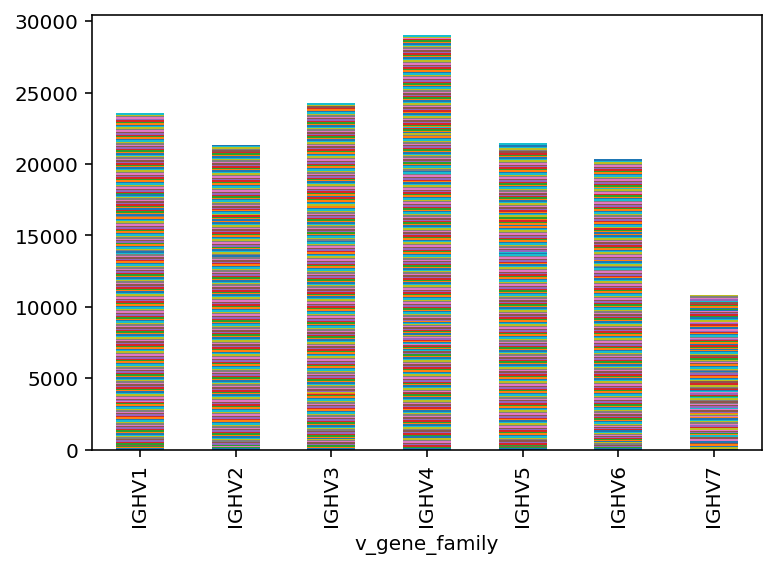

In [44]:
counts = heavy_seqs.groupby(['v_gene_family','subject']).size().rename('sequences').unstack()
counts.plot.bar(stacked=True, legend=False);

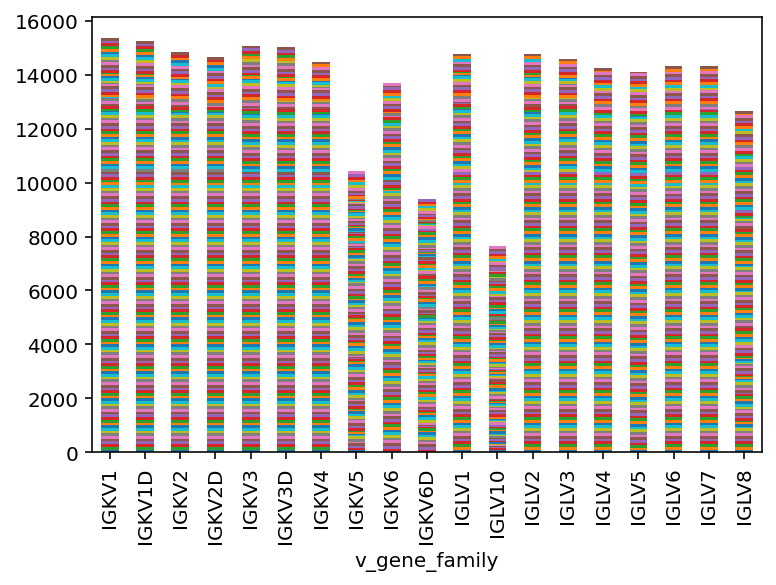

In [45]:
counts = light_seqs.groupby(['v_gene_family','subject']).size().rename('sequences').unstack()
counts.plot.bar(stacked=True, legend=False);

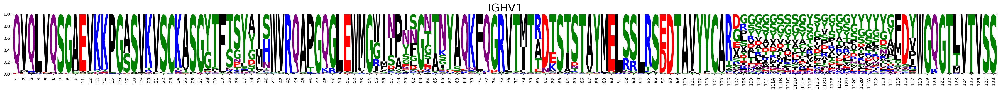

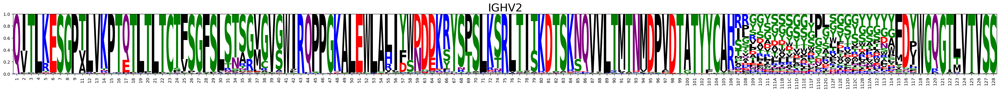

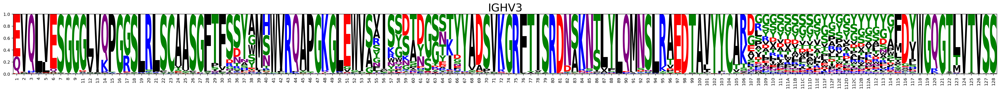

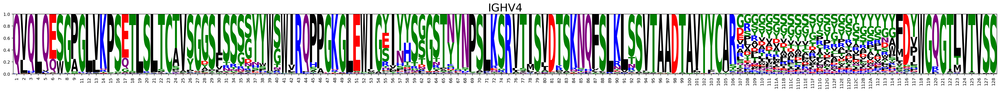

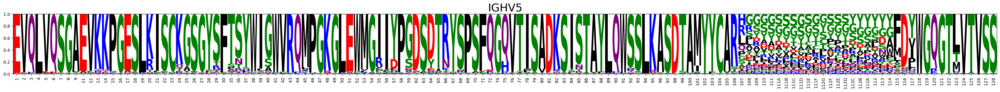

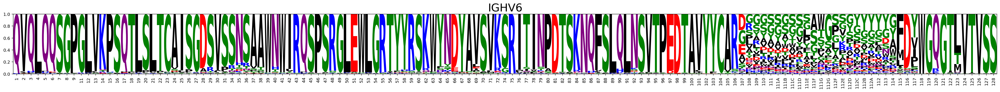

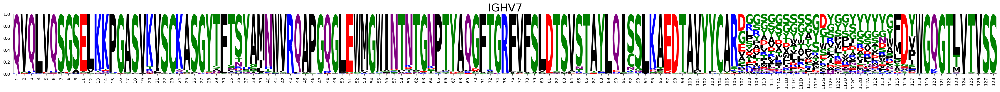

In [55]:
for family, seqs in heavy_seqs.groupby('v_gene_family'):
    freq = compute_freq(seqs[HEAVY_POSITIONS])
    ax = plot_logo(freq)
    ax.set_title(family, fontsize=25)
    freq_formatted = freq.apply(lambda col: col.apply(lambda v: '0' if v == 0 else '{:.4f}'.format(v)))
    freq_formatted.to_csv(f'../../data/oas_stats/imgt_residue_frequency/{family}.tsv', sep='\t')

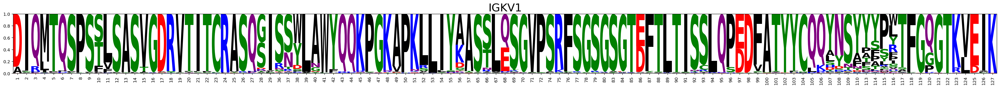

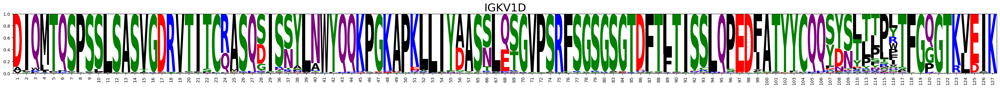

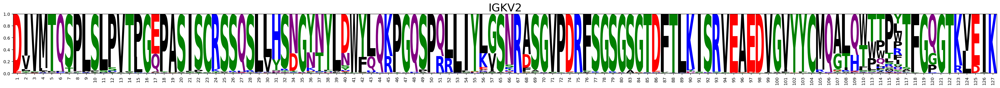

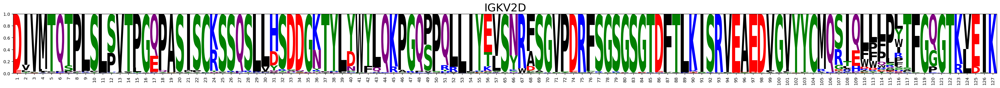

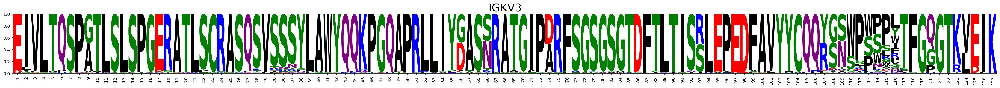

...

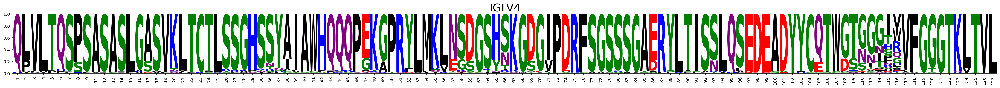

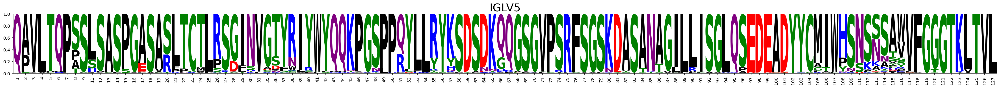

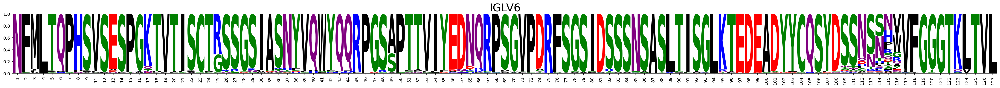

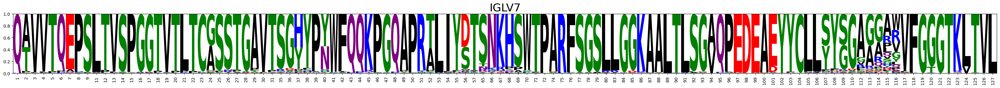

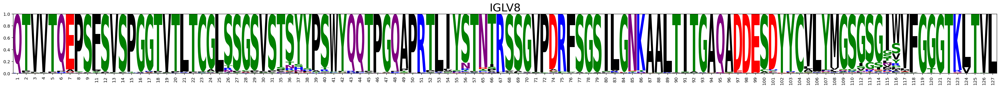

In [56]:
for family, seqs in light_seqs.groupby('v_gene_family'):
    freq = compute_freq(seqs[LIGHT_POSITIONS])
    ax = plot_logo(freq)
    ax.set_title(family, fontsize=25)
    freq_formatted = freq.apply(lambda col: col.apply(lambda v: '0' if v == 0 else '{:.4f}'.format(v)))
    freq_formatted.to_csv(f'../../data/oas_stats/imgt_residue_frequency/{family}.tsv', sep='\t')

## Exporting to JSON

In [6]:
import glob
import json

In [22]:
json_export = {}

paths = glob.glob(f'../../data/oas_stats/imgt_residue_frequency/*.tsv')
paths = sorted(paths, key=lambda v: (-int('Heavy' in v), -int('Lambda' in v), -int('Kappa' in v), v))

for path in paths:
    name = path.split('/')[-1].rsplit('.',1)[0]
    df = pd.read_csv(path, sep='\t', index_col=0)
    json_export[name] = {str(pos): {aa: freq for aa, freq in row.items() if freq != 0} for pos, row in df.iterrows()}

with open('../../data/oas_stats/imgt_residue_frequency.json', 'wt') as f:
    json_str = json.dumps(json_export, indent=2)
    json_str = json_str.replace(',\n      "',', "')
    json_str = json_str.replace('{\n      "','{ "')
    json_str = json_str.replace('\n    }',' }')
    
    f.write(json_str)

## Mutation frequency

In [83]:
HEAVY_CDR_POSITIONS = [
       '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', 
       '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', 
       '105', '106', '107', '108', '109', '110', '111', '111A', '111B', '111C', '111D', '111E', '111F',
       '111G', '111H', '111I', '111J', '111K', '111L', '112L', '112K',
       '112J', '112I', '112H', '112G', '112F', '112E', '112D', '112C',
       '112B', '112A', '112', '113', '114', '115', '116', '117'
]

In [101]:
n = 10000
min_freq = 0.10
max_freq = 0.90
random_state = 1

mutations = []
for family, seqs in heavy_seqs.groupby('v_gene_family'):
    freq = compute_freq(seqs[HEAVY_POSITIONS], min_seqs=len(seqs)/10)
    # turn into vertical table with one row for a given residue at a given position
    choices = freq.melt(var_name='residue', value_name='freq', ignore_index=False).reset_index()
    # select only choices with probability in given range
    choices = choices[(choices['freq'] >= min_freq) & (choices['freq'] <= max_freq)]
    imgt_positions = choices['imgt_pos'].drop_duplicates().sort_values()
    print(f'Sampling {family} mutations from {len(seqs):,} seqs, {len(imgt_positions):,} positions: {" ".join(imgt_positions)}')
    np.random.seed(random_state)

    for sample in range(n):
        seqs_with_positions = seqs
        matching_seqs = seqs
        # select random IMGT positions
        random_positions = imgt_positions.sample(n=3).values
        mutation = {
            'family': family,
            'sample': sample
        }
        expected_freq = 1
        for i, imgt_pos in enumerate(random_positions):
            # select random mutation at given position
            choice = choices[choices['imgt_pos'] == imgt_pos].sample(1).iloc[0]
            seqs_with_positions = seqs_with_positions[seqs_with_positions[imgt_pos] != '-']
            matching_seqs = matching_seqs[matching_seqs[imgt_pos] == choice['residue']]
            expected_freq = expected_freq * choice['freq']
            mutation[f'region{i+1}'] = 'CDR' if imgt_pos in HEAVY_CDR_POSITIONS else 'FR'
            mutation[f'imgt_pos{i+1}'] = imgt_pos
            mutation[f'residue{i+1}'] = choice['residue']
            mutation[f'marginal_freq{i+1}'] = choice['freq']
            mutation[f'expected_joint_freq{i+1}'] = expected_freq
            mutation[f'observed_joint_freq{i+1}'] = len(matching_seqs) / len(seqs_with_positions)
        mutations.append(mutation)
mutations = pd.DataFrame(mutations)
mutations.head()

Sampling IGHV1 mutations from 23,566 seqs, 58 positions: 106 107 108 109 110 111 111A 111B 111C 111D 112 112A 112B 112C 112D 113 114 115 116 117 123 17 20 24 25 28 29 35 36 37 38 39 40 46 48 55 56 57 58 59 62 64 65 66 68 70 71 78 80 81 82 84 85 87 92 93 95 97
Sampling IGHV2 mutations from 21,362 seqs, 45 positions: 106 107 108 109 11 110 111 111A 111B 111C 112 112A 112B 112C 112D 113 114 115 116 117 123 17 2 24 25 31 34 35 36 37 38 40 5 55 57 58 59 64 66 68 69 72 74 79 85
Sampling IGHV3 mutations from 24,258 seqs, 56 positions: 1 101 105 106 107 108 109 110 111 111A 111B 111C 112 112A 112B 112C 112D 113 114 115 116 117 12 123 14 17 24 29 30 35 36 37 38 39 40 5 51 54 55 57 58 59 62 63 64 65 66 68 69 82 83 86 87 92 95 96
Sampling IGHV4 mutations from 29,009 seqs, 57 positions: 106 107 108 109 110 111 111A 111B 111C 112 112A 112B 112C 112D 113 114 115 116 117 120 123 13 17 2 24 26 28 30 31 34 35 36 37 38 40 42 45 55 56 57 58 59 6 64 65 66 68 7 72 78 80 82 84 85 9 90 92
Sampling IGHV5 muta

,family,sample,region1,imgt_pos1,residue1,marginal_freq1,expected_joint_freq1,observed_joint_freq1,region2,imgt_pos2,residue2,marginal_freq2,expected_joint_freq2,observed_joint_freq2,region3,imgt_pos3,residue3,marginal_freq3,expected_joint_freq3,observed_joint_freq3
0,IGHV1,0,FR,80,R,0.419588,0.419588,0.419588,CDR,108,G,0.158221,0.066387,0.063365,FR,55,W,0.472163,0.031346,0.042258
1,IGHV1,1,FR,81,D,0.897098,0.897098,0.897098,FR,71,F,0.800942,0.718523,0.710897,CDR,116,D,0.840363,0.603820,0.597004
2,IGHV1,2,CDR,112A,G,0.130133,0.130133,0.130133,CDR,112D,S,0.140104,0.018232,0.010069,CDR,109,G,0.173928,0.003171,0.002014
3,IGHV1,3,FR,87,V,0.136850,0.136850,0.136850,FR,82,E,0.187601,0.025673,0.007893,FR,95,R,0.878172,0.022545,0.005135
4,IGHV1,4,CDR,112A,G,0.130133,0.130133,0.130133,CDR,36,S,0.593876,0.077283,0.075454,CDR,62,F,0.214359,0.016566,0.023715


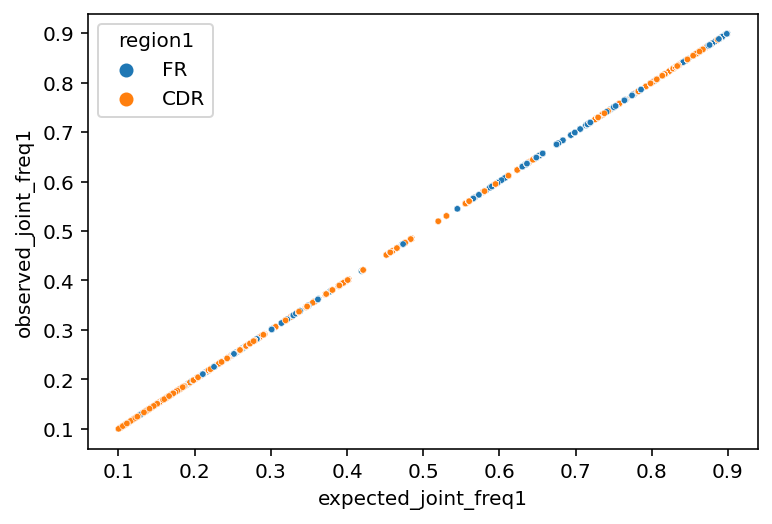

In [102]:
sns.scatterplot(
    data=mutations,
    x='expected_joint_freq1',
    y='observed_joint_freq1',
    hue='region1',
    s=10
);

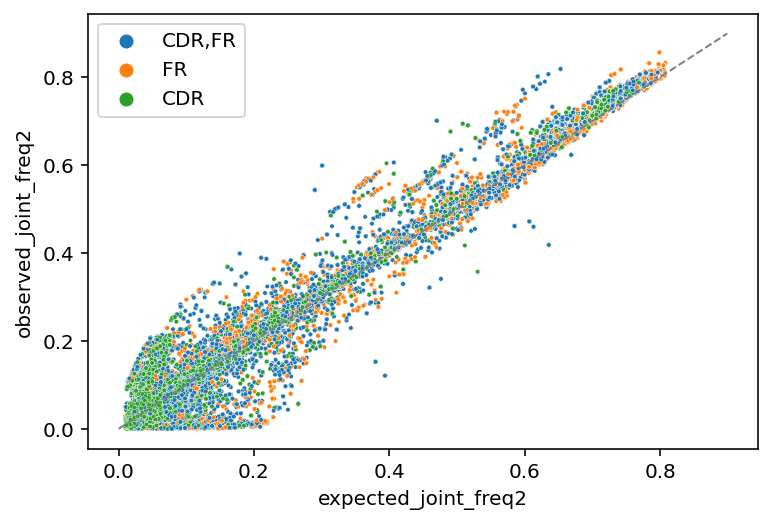

In [103]:
ax = sns.scatterplot(
    data=mutations,
    x='expected_joint_freq2',
    y='observed_joint_freq2',
    hue=mutations[['region1','region2']].apply(set, axis=1).apply(','.join),
    s=5
);
m = max(ax.get_xlim()[1], ax.get_ylim()[1])
ax.plot([0, m], [0, m], ls='--', color='grey', lw=1);

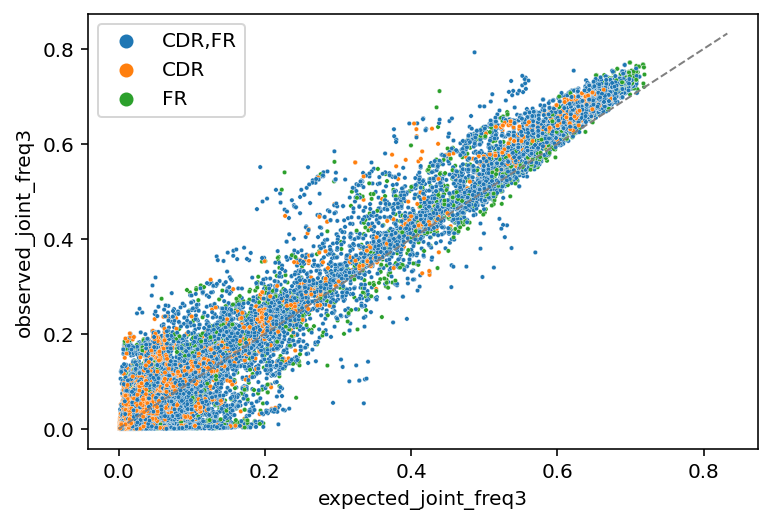

In [105]:
ax = sns.scatterplot(
    data=mutations,
    x='expected_joint_freq3',
    y='observed_joint_freq3',
    hue=mutations[['region1','region2','region3']].apply(set, axis=1).apply(','.join),
    s=5
);
m = max(ax.get_xlim()[1], ax.get_ylim()[1])
ax.plot([0, m], [0, m], ls='--', color='grey', lw=1);

In [470]:
mutations[['imgt_pos1','imgt_pos2','imgt_pos3']].melt()['value'].value_counts()

112     785
112A    770
109     770
112B    769
108     768
       ... 
82       70
71       68
26       66
83       63
84       62
Name: value, Length: 72, dtype: int64

In [471]:
mutations[['residue1','residue2','residue3']].melt()['value'].value_counts()

G    4995
S    3982
Y    3013
A    1059
T    1008
M    1000
V     886
R     867
N     761
I     635
D     439
L     425
E     346
F     298
W     260
H     259
K     251
P     219
Q     214
C      83
Name: value, dtype: int64

In [472]:
mutations.to_csv(os.path.join(TASK_DIR, 'mutations.tsv'), sep='\t', index=False)

In [107]:
rare_pairs = mutations[mutations['observed_joint_freq2'] < 0.01][['family','sample','region1','imgt_pos1','residue1','marginal_freq1','expected_joint_freq1','observed_joint_freq1','region2','imgt_pos2','residue2','marginal_freq2','expected_joint_freq2','observed_joint_freq2']]
rare_pairs.head()

,family,sample,region1,imgt_pos1,residue1,marginal_freq1,expected_joint_freq1,observed_joint_freq1,region2,imgt_pos2,residue2,marginal_freq2,expected_joint_freq2,observed_joint_freq2
3,IGHV1,3,FR,87,V,0.136850,0.136850,0.136850,FR,82,E,0.187601,0.025673,0.007893
32,IGHV1,32,CDR,36,G,0.155052,0.155052,0.155052,CDR,62,N,0.221295,0.034312,0.006005
43,IGHV1,43,CDR,117,V,0.222100,0.222100,0.222100,CDR,112,G,0.114811,0.025500,0.007853
91,IGHV1,91,FR,78,M,0.544810,0.544810,0.544810,FR,80,A,0.318340,0.173435,0.008826
100,IGHV1,100,FR,71,L,0.146100,0.146100,0.146100,FR,39,M,0.304464,0.044482,0.008062


In [109]:
rare_pairs_fr = rare_pairs[(rare_pairs['region1'] == 'FR') & (rare_pairs['region2'] == 'FR')]
rare_pairs_fr.sort_values('expected_joint_freq2', ascending=False).head(10)

,family,sample,region1,imgt_pos1,residue1,marginal_freq1,expected_joint_freq1,observed_joint_freq1,region2,imgt_pos2,residue2,marginal_freq2,expected_joint_freq2,observed_joint_freq2
19070,IGHV2,9070,FR,69,T,0.332834,0.332834,0.332834,FR,2,I,0.611787,0.203624,0.008707
12091,IGHV2,2091,FR,69,T,0.332834,0.332834,0.332834,FR,2,I,0.611787,0.203624,0.008707
12054,IGHV2,2054,FR,2,I,0.611787,0.611787,0.611787,FR,69,T,0.332834,0.203624,0.008707
18896,IGHV2,8896,FR,11,T,0.607293,0.607293,0.607293,FR,69,T,0.332834,0.202128,0.006320
11951,IGHV2,1951,FR,69,T,0.332834,0.332834,0.332834,FR,11,T,0.607293,0.202128,0.006320
17498,IGHV2,7498,FR,69,T,0.332834,0.332834,0.332834,FR,11,T,0.607293,0.202128,0.006320
12585,IGHV2,2585,FR,2,I,0.611787,0.611787,0.611787,FR,40,S,0.329510,0.201590,0.007911
16531,IGHV2,6531,FR,40,S,0.329510,0.329510,0.329510,FR,2,I,0.611787,0.201590,0.007911
16553,IGHV2,6553,FR,40,S,0.329510,0.329510,0.329510,FR,2,I,0.611787,0.201590,0.007911
16183,IGHV2,6183,FR,2,I,0.611787,0.611787,0.611787,FR,40,S,0.329510,0.201590,0.007911


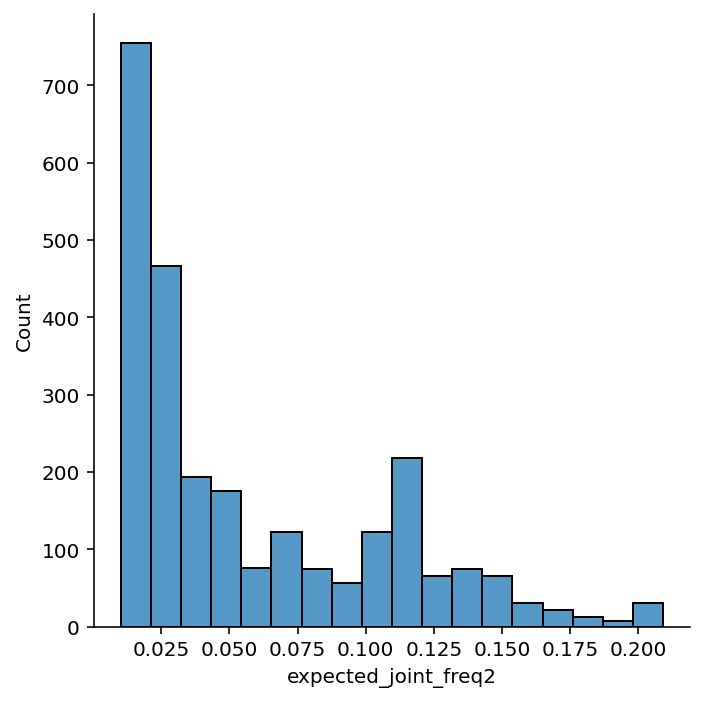

In [114]:
sns.displot(x=rare_pairs['expected_joint_freq2']);

In [115]:
rare_triples = mutations[mutations['observed_joint_freq3'] < 0.01]
rare_triples.head()

,family,sample,region1,imgt_pos1,residue1,marginal_freq1,expected_joint_freq1,observed_joint_freq1,region2,imgt_pos2,residue2,marginal_freq2,expected_joint_freq2,observed_joint_freq2,region3,imgt_pos3,residue3,marginal_freq3,expected_joint_freq3,observed_joint_freq3
2,IGHV1,2,CDR,112A,G,0.130133,0.130133,0.130133,CDR,112D,S,0.140104,0.018232,0.010069,CDR,109,G,0.173928,0.003171,0.002014
3,IGHV1,3,FR,87,V,0.136850,0.136850,0.136850,FR,82,E,0.187601,0.025673,0.007893,FR,95,R,0.878172,0.022545,0.005135
6,IGHV1,6,CDR,59,N,0.235884,0.235884,0.235884,FR,48,Q,0.899219,0.212111,0.226756,CDR,62,N,0.221295,0.046939,0.007745
9,IGHV1,9,CDR,111C,S,0.174440,0.174440,0.174440,CDR,112A,G,0.130133,0.022700,0.014588,CDR,113,G,0.142495,0.003235,0.001644
11,IGHV1,11,FR,20,K,0.894679,0.894679,0.894679,CDR,38,A,0.326402,0.292025,0.297208,FR,71,L,0.146100,0.042665,0.005644


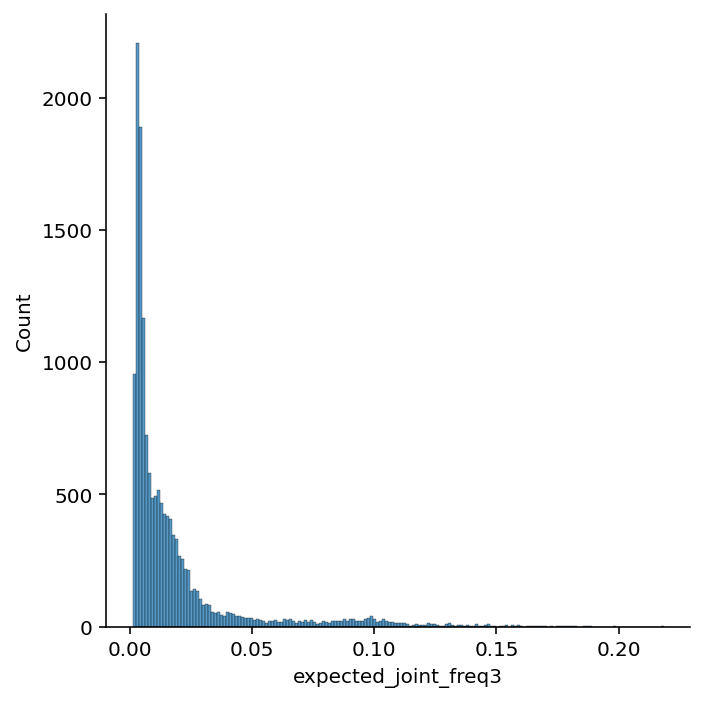

In [116]:
sns.displot(x=rare_triples['expected_joint_freq3']);

In [122]:
missing_triples = mutations[mutations['observed_joint_freq3'] == 0].sort_values(by='expected_joint_freq3', ascending=False)
missing_triples.head(10)

,family,sample,region1,imgt_pos1,residue1,marginal_freq1,expected_joint_freq1,observed_joint_freq1,region2,imgt_pos2,residue2,marginal_freq2,expected_joint_freq2,observed_joint_freq2,region3,imgt_pos3,residue3,marginal_freq3,expected_joint_freq3,observed_joint_freq3
68687,IGHV7,8687,FR,123,T,0.210745,0.210745,0.210745,CDR,117,Y,0.372650,0.078534,0.000000,CDR,116,D,0.833472,0.065456,0.0
52124,IGHV6,2124,FR,123,T,0.186399,0.186399,0.186399,CDR,117,Y,0.389922,0.072681,0.000000,FR,77,T,0.883870,0.064241,0.0
58027,IGHV6,8027,CDR,34,S,0.854343,0.854343,0.854343,FR,123,T,0.186399,0.159249,0.164514,CDR,117,Y,0.389922,0.062095,0.0
34339,IGHV4,4339,CDR,59,S,0.807241,0.807241,0.807241,CDR,117,Y,0.380744,0.307352,0.327005,FR,123,T,0.148161,0.045538,0.0
19705,IGHV2,9705,CDR,106,H,0.530475,0.530475,0.530475,CDR,112D,G,0.191887,0.101791,0.103992,FR,79,S,0.358159,0.036457,0.0
975,IGHV1,975,CDR,62,F,0.214359,0.214359,0.214359,CDR,64,N,0.283459,0.060762,0.000340,FR,78,M,0.544810,0.033104,0.0
34276,IGHV4,4276,CDR,57,N,0.202100,0.202100,0.202100,FR,7,W,0.196973,0.039808,0.174126,CDR,34,S,0.831062,0.033083,0.0
62799,IGHV7,2799,FR,123,T,0.210745,0.210745,0.210745,CDR,117,P,0.170660,0.035966,0.000184,CDR,64,N,0.867213,0.031190,0.0
67727,IGHV7,7727,CDR,29,T,0.862698,0.862698,0.862698,CDR,117,P,0.170660,0.147228,0.150111,FR,123,T,0.210745,0.031027,0.0
34163,IGHV4,4163,CDR,34,S,0.831062,0.831062,0.831062,CDR,57,N,0.202100,0.167957,0.010238,CDR,111C,S,0.183582,0.030834,0.0


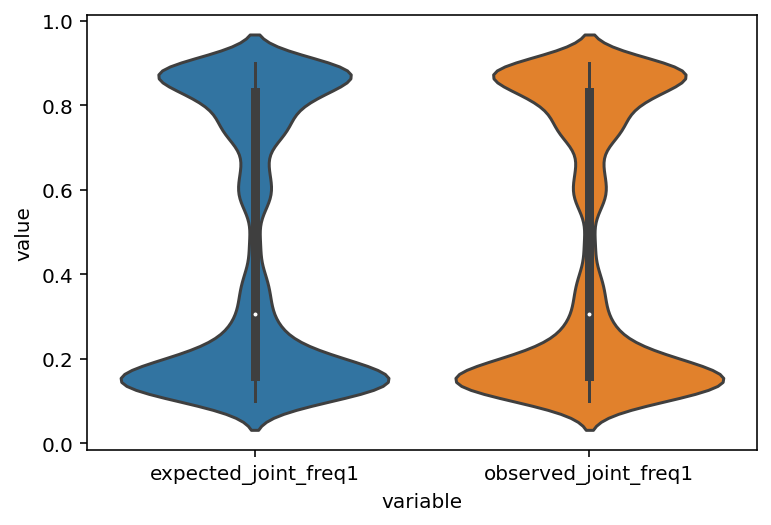

In [121]:
sns.violinplot(
    data=mutations[['expected_joint_freq1','observed_joint_freq1']].melt(),
    x='variable',
    y='value'
);